# Diabetes readmission
## Exploratory Data Analysis


The dataset represents 10 years (1999-2008) of clinical care at 130 US hospitals and integrated delivery networks. It includes over 50 features representing patient and hospital outcomes. Information was extracted from the database for encounters that satisfied the following criteria.

1.	It is an inpatient encounter (a hospital admission).
2.	It is a diabetic encounter, that is, one during which any kind of diabetes was entered to the system as a diagnosis.
3.	The length of stay was at least 1 day and at most 14 days.
4.	Laboratory tests were performed during the encounter.
5.	Medications were administered during the encounter.

The data contains such attributes as patient number, race, gender, age, admission type, time in hospital, medical specialty of admitting physician, number of lab test performed, HbA1c test result, diagnosis, number of medication, diabetic medications, number of outpatient, inpatient, and emergency visits in the year before the hospitalization, etc.

Beata Strack, Jonathan P. DeShazo, Chris Gennings, Juan L. Olmo, Sebastian Ventura, Krzysztof J. Cios, and John N. Clore, “Impact of HbA1c Measurement on Hospital Readmission Rates: Analysis of 70,000 Clinical Database Patient Records,” BioMed Research International, vol. 2014, Article ID 781670, 11 pages, 2014.

### Data dictionary
https://www.hindawi.com/journals/bmri/2014/781670/tab1/

# Import libraries

In [2]:
%load_ext kedro.ipython

[10/18/23 21:25:38] INFO     Resolved project path as:                                              ]8;id=691009;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=761749;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#139\139]8;;\
                             /home/sebastiancardonal/diabetes_udemy_deploying_course.                              
                             To set a different path, run '%reload_kedro <project_root>'                           

[10/18/23 21:25:38] WARNING  /home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3 ]8;id=430645;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=500703;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/warnings.py#109\109]8;;\
                             .10/site-packages/kedro/framework/session/session.py:266:                             
                             FutureWarning: ConfigLoader will be deprecated in Kedro 0.19. Please                  
                             use the OmegaConfigLoader instead. To consult the documentation for                   
                             OmegaConfigLoader, see here:                                                          
                             https://docs.kedro.org/en/stable/configuration/advanced_configuration.                
                             html#omegaconfigloader                                                                
                               warnings.warn(                                                                      
                                                                                                                   

[10/18/23 21:25:39] INFO     Kedro project diabetes readmission                                     ]8;id=93568;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=387353;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#108\108]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=26237;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=350263;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#109\109]8;;\
                             'pipelines'                                                                           

[10/18/23 21:25:40] INFO     Registered line magic 'run_viz'                                        ]8;id=621958;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=121643;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

In [3]:
%reload_ext kedro.ipython

                    INFO     Resolved project path as:                                              ]8;id=654019;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=289855;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#139\139]8;;\
                             /home/sebastiancardonal/diabetes_udemy_deploying_course.                              
                             To set a different path, run '%reload_kedro <project_root>'                           

[10/18/23 21:25:40] WARNING  /home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3 ]8;id=18771;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=42782;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/warnings.py#109\109]8;;\
                             .10/site-packages/kedro/framework/session/session.py:266:                             
                             FutureWarning: ConfigLoader will be deprecated in Kedro 0.19. Please                  
                             use the OmegaConfigLoader instead. To consult the documentation for                   
                             OmegaConfigLoader, see here:                                                          
                             https://docs.kedro.org/en/stable/configuration/advanced_configuration.                
                             html#omegaconfigloader                                                                
                               warnings.warn(                                                                      
                                                                                                                   

                    INFO     Kedro project diabetes readmission                                     ]8;id=780025;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=680817;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#108\108]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=494263;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=725820;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#109\109]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=846532;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=715421;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

In [ ]:
%matplotlib inline

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

pd.pandas.set_option('display.max_columns', None)

In [5]:
#Import data catalog
catalog.list()

['diabetes_data', 'parameters']

In [6]:
#Import pipelines
pipelines

{'__default__': Pipeline([])}

# Read data

In [7]:
df = catalog.load("diabetes_data")

[10/18/23 21:25:41] INFO     Loading data from 'diabetes_data' (CSVDataSet)...                  ]8;id=920127;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=990319;file:///home/sebastiancardonal/miniconda3/envs/py310_deploy_udemy/lib/python3.10/site-packages/kedro/io/data_catalog.py#492\492]8;;\

# Data exploration

We will analyse the following:

1. The target variable
2. Variable types (categorical and numerical)
3. Missing data
4. Numerical variables:
    * Discrete
    * Continuous
    * Distributions
5. Categorical variables:
    * Cardinality
    * Rare Labels
    * Special mappings
6. Relationship between covariables and target variable

In [8]:
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [9]:
# replace interrogation marks by NaN values
df = df.replace('?', np.nan)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      99493 non-null   object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    3197 non-null    object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                61510 non-null   object
 11  medical_specialty         51817 non-null   object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [11]:
# Let's create a profiling report
profile = ProfileReport(df, title="Pandas Profiling Report")

In [12]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.HTML object>

<class 'ydata_profiling.profile_report.ProfileReport'>.__repr__ returned empty string

## Target variable

From the previous profile report we can see that the `readmitted` target column has the next distribution:

* 54% of pacients are not readmitted
* 35% was readmitted in <30 days
* 11% was readmitted in >30 days

The target column is categorical, then our objective is to build a supervised classification model. To simplify, we are going to split the target column in 2 labels:

* 0: Not readmitted
* 1: readmitted

## Variable types

According to the data definition, all the columns have been correctly assigned their types.

We can drop the ids columns.

In [13]:
# Drop id columns
cols_to_drop = [
    "encounter_id",
    "patient_nbr",
]

df = df.drop(columns=cols_to_drop)

In [14]:
# let's identify the categorical variables
# we will capture those of type *object*

target_var = "readmitted"

cat_vars = [var for var in df.columns if df[var].dtype == 'O' and var != target_var]

# lets add these columns to the list of categorical variables
cat_vars = cat_vars + ['admission_type_id', 'discharge_disposition_id', 'admission_source_id']

# cast all variables as categorical
df[cat_vars] = df[cat_vars].astype('O')

# number of categorical variables
print(len(cat_vars))
cat_vars

39



[
    'race',
    'gender',
    'age',
    'weight',
    'payer_code',
    'medical_specialty',
    'diag_1',
    'diag_2',
    'diag_3',
    'max_glu_serum',
    'A1Cresult',
    'metformin',
    'repaglinide',
    'nateglinide',
    'chlorpropamide',
    'glimepiride',
    'acetohexamide',
    'glipizide',
    'glyburide',
    'tolbutamide',
    'pioglitazone',
    'rosiglitazone',
    'acarbose',
    'miglitol',
    'troglitazone',
    'tolazamide',
    'examide',
    'citoglipton',
    'insulin',
    'glyburide-metformin',
    'glipizide-metformin',
    'glimepiride-pioglitazone',
    'metformin-rosiglitazone',
    'metformin-pioglitazone',
    'change',
    'diabetesMed',
    'admission_type_id',
    'discharge_disposition_id',
    'admission_source_id'
]

In [17]:
# now let's identify the numerical variables
num_vars = [
    var for var in df.columns if var not in cat_vars and var != target_var
]

# number of numerical variables
print(len(num_vars))
num_vars

8



[
    'time_in_hospital',
    'num_lab_procedures',
    'num_procedures',
    'num_medications',
    'number_outpatient',
    'number_emergency',
    'number_inpatient',
    'number_diagnoses'
]

## Missing values

In [16]:
# make a list of the variables that contain missing values
vars_with_na = [var for var in df.columns if df[var].isnull().sum() > 0]

# determine percentage of missing values (expressed as decimals)
# and display the result ordered by % of missin data

df[vars_with_na].isnull().mean().sort_values(ascending=False)


weight               0.968585
medical_specialty    0.490822
payer_code           0.395574
race                 0.022336
diag_3               0.013983
diag_2               0.003518
diag_1               0.000206
dtype: float64

The dataset contains a few variables with a big proportion of missing values, and some others with a small percentage of missing values. We will need to impute the missing data.

## Numerical variables

In [20]:
# visualise the numerical variables
df_num = df[num_vars + [target_var]]
df_num

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,readmitted
0,1,41,0,1,0,0,0,1,NO
1,3,59,0,18,0,0,0,9,>30
2,2,11,5,13,2,0,1,6,NO
3,2,44,1,16,0,0,0,7,NO
4,1,51,0,8,0,0,0,5,NO
...,...,...,...,...,...,...,...,...,...
101761,3,51,0,16,0,0,0,9,>30
101762,5,33,3,18,0,0,1,9,NO
101763,1,53,0,9,1,0,0,13,NO
101764,10,45,2,21,0,0,1,9,NO


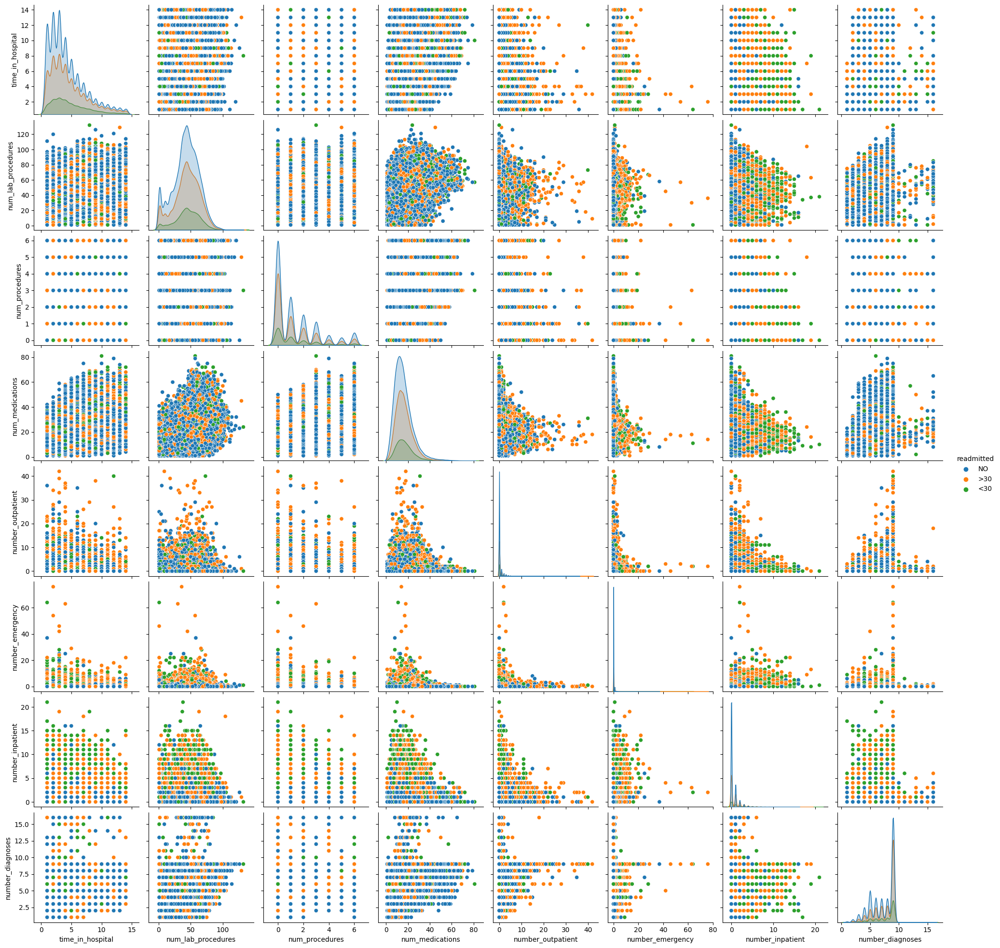

In [28]:
sns.pairplot(df_num, hue="readmitted")